In [1]:
#import numpy as np
import pandas as pd
import osmnx as ox
import geopandas as gpd
#import folium
import matplotlib.pyplot as plt
from shapely.geometry import box
#from geopy.distance import geodesic
#from scipy.spatial import cKDTree
import contextily as ctx


/opt/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
#Extract the file containing all the data

file_path = 'raw_data1.csv'
df = pd.read_csv(file_path)

# Charger le fichier CSV
gares_df = pd.read_csv("data_CSV/liste-des-gares.csv", delimiter=";")


print("The dataframe of all data has the shape:",df.shape)
print("The parameters given by the data are:",df.columns.tolist())

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/547282978.py:4: DtypeWarning: Columns (8,30) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


The dataframe of all data has the shape: (340284, 31)
The parameters given by the data are: ['departure', 'arrival', 'route', 'departure_date_num', 'departure_time', 'seats_total', 'seats_booked', 'distance_BBC', 'announce_published_date', 'announce_views', 'arrival_latitude', 'arrival_longitude', 'car_mark', 'car_model', 'comment_average_note', 'commission', 'departure_date', 'departure_latitude', 'departure_longitude', 'departure_strike', 'driver_age', 'driving_quality', 'experience', 'member_since_month', 'member_since_year', 'price_driver', 'price_driver_default', 'price_driver_hcap', 'price_driver_lcap', 'published_ads', 'trip_description']


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/2512162986.py:10: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  paris_departures['departure_time'] = pd.to_datetime(paris_departures['departure_time'])


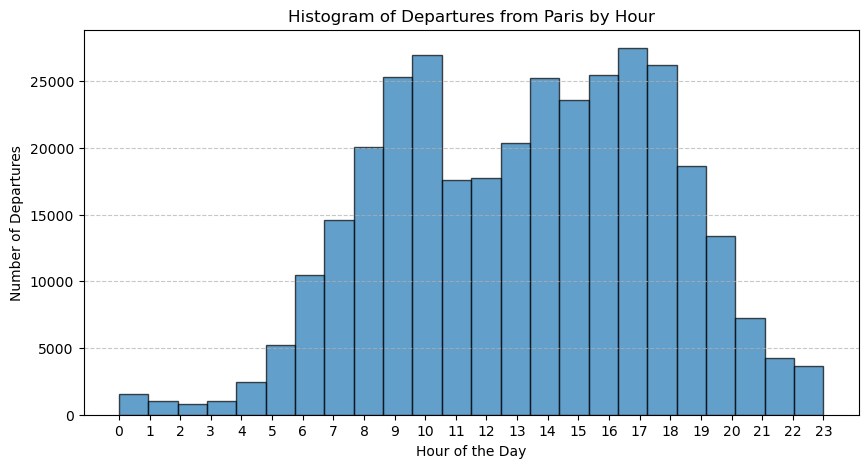

In [3]:
import pandas as pd
import matplotlib.pyplot as plt


# Ensure the column names match the dataset
# Filter trips departing from Paris
paris_departures = df

# Convert departure_time to datetime format (if it's not already)
paris_departures['departure_time'] = pd.to_datetime(paris_departures['departure_time'])

# Extract the hour of departure
paris_departures['hour'] = paris_departures['departure_time'].dt.hour

# Plot histogram
plt.figure(figsize=(10, 5))
plt.hist(paris_departures['hour'], bins=24, range=(0, 23), edgecolor='black', alpha=0.7)

# Labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Departures')
plt.title('Histogram of Departures from Paris by Hour')
plt.xticks(range(24))
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show plot
plt.show()


In [4]:
#Extracting the extrema coordinates for points departing from Paris

paris_df = df[df['departure'] == 'Paris']

min_lat = paris_df['departure_latitude'].min()
max_lat = paris_df['departure_latitude'].max()
min_lon = paris_df['departure_longitude'].min()
max_lon = paris_df['departure_longitude'].max()

print("The minimum latitude value of points departing from Paris is:",min_lat)
print("The maximum latitude value of points departing from Paris is:",max_lat)
print("The minimum longitude value of points departing from Paris is:",min_lon)
print("The maximum longitude value of points departing from Paris is:",max_lon)
print("Paris data is of shape:",paris_df.shape)

The minimum latitude value of points departing from Paris is: 48.26072693
The maximum latitude value of points departing from Paris is: 49.43014526
The minimum longitude value of points departing from Paris is: 1.438706994
The maximum longitude value of points departing from Paris is: 3.231481075
Paris data is of shape: (169283, 32)


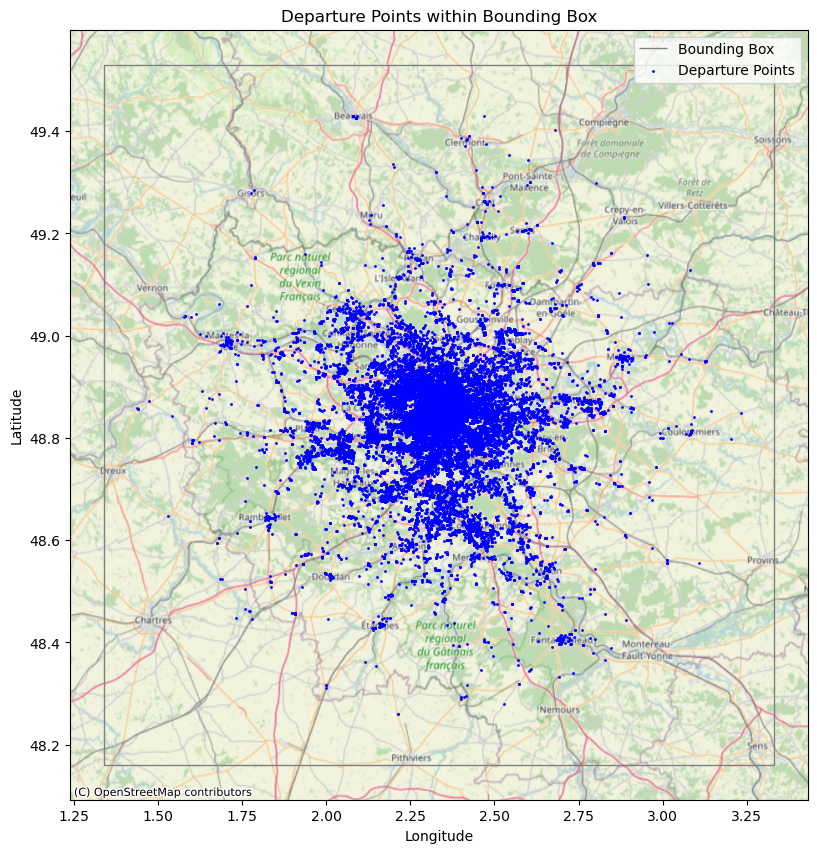

In [5]:
#Represent the bounding box for departure points being from Paris

bbox = box(min_lon-0.1, min_lat-0.1, max_lon+0.1, max_lat+0.1)

departure_gdf = gpd.GeoDataFrame(paris_df,
                                 geometry=gpd.points_from_xy(paris_df.departure_longitude, paris_df.departure_latitude),
                                 crs='EPSG:4326')

departure_gdf = departure_gdf[departure_gdf.geometry.within(bbox)]

bbox_gdf = gpd.GeoDataFrame(geometry=[bbox], crs="EPSG:4326")

fig, ax = plt.subplots(figsize=(10, 10))
bbox_gdf.boundary.plot(ax=ax, color='grey', linewidth=1, label='Bounding Box')

departure_gdf.plot(ax=ax, color='blue', markersize=1, label='Departure Points')

ctx.add_basemap(ax, crs=departure_gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

plt.legend()
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Departure Points within Bounding Box")
plt.show()

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/4234983558.py:2: FutureWarning: The `utils.config` function is deprecated and will be removed in the v2.0.0 release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ox.config(use_cache=True, log_console=True)


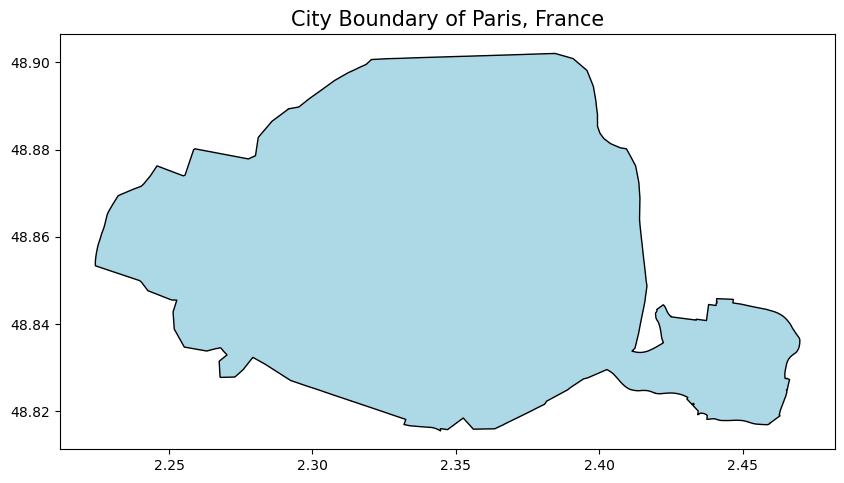

In [6]:
# Configure OSMnx to use a quicker source of OSM data (optional)
ox.config(use_cache=True, log_console=True)

# Get the boundary of Paris, France
city_name = "Paris, France"
gdf = ox.geocode_to_gdf(city_name)

# Plot the boundary
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, facecolor='lightblue', edgecolor='black')

# Set title and display the plot
ax.set_title(f'City Boundary of {city_name}', fontsize=15)
plt.show()

In [7]:
from shapely.geometry import Point
# Step 1: Get the boundary of Paris, France
city_name = "Paris, France"
paris_boundary = ox.geocode_to_gdf(city_name)

# Step 2: Convert your DataFrame points into a GeoDataFrame
# Create a geometry column from the latitude and longitude columns
geometry = [Point(xy) for xy in zip(paris_df['departure_longitude'], paris_df['departure_latitude'])]
points_gdf = gpd.GeoDataFrame(paris_df, geometry=geometry)

# Step 3: Ensure both GeoDataFrames are in the same coordinate reference system (CRS)
points_gdf.set_crs(epsg=4326, inplace=True)  # Assuming your points are in WGS84 (latitude/longitude)
paris_boundary = paris_boundary.to_crs(epsg=4326)  # Ensure the boundary is also in WGS84

# Step 4: Perform a spatial join to check if points are inside the boundary
points_inside = points_gdf[points_gdf.within(paris_boundary.geometry.iloc[0])]

# Step 5: Count points inside and outside
num_inside = len(points_inside)
num_outside = len(points_gdf) - num_inside

# Output results
print(f"Number of points inside Paris: {num_inside}")
print(f"Number of points outside Paris: {num_outside}")


Number of points inside Paris: 83259
Number of points outside Paris: 86024


In [8]:
from shapely.geometry import Point

# Configure OSMnx to use cache and console logging
ox.config(use_cache=True, log_console=True)

# Step 1: Get the boundary of Paris, France
city_name = "Paris, France"
paris_gdf = ox.geocode_to_gdf(city_name)
paris_gdf = paris_gdf.to_crs("EPSG:4326") 
paris_boundary = paris_gdf.unary_union  # Use as a polygon for filtering

# Step 2: Load your CSV data (inside Paris) and filter points within the Paris boundary
csv_file_path = "data_CSV/belib-points-de-recharge-pour-vehicules-electriques-donnees-statiques.csv"  # Update with your actual CSV path
csv_data = pd.read_csv(csv_file_path, sep=';')

# Split 'coordonneesXY' into 'longitude' and 'latitude'
csv_data[['latitude', 'longitude']] = csv_data['coordonneesXY'].str.split(',', expand=True).astype(float)
csv_data['name'] = csv_data['nom_station']

# Convert latitude and longitude into Point geometries
csv_data['geometry'] = csv_data.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
csv_gdf = gpd.GeoDataFrame(csv_data, geometry='geometry', crs='EPSG:4326')

# Filter points within the Paris boundary
csv_gdf = csv_gdf[csv_gdf.geometry.within(paris_boundary)]

# Step 3: Use OSMnx to get stations within a bounding box around Paris
# Define the bounding box (can use Paris coordinates or custom bounding box)
north, south, east, west = paris_boundary.bounds
tag = {'amenity': 'charging_station'}


# Query all stations in the bounding box
all_stations = ox.geometries_from_bbox(north=max_lat, south=min_lat, east=max_lon, west=min_lon, tags=tag)
all_stations_points = all_stations[all_stations.geometry.geom_type == 'Point']

# Extract latitude and longitude
all_stations_points['latitude'] = all_stations_points.geometry.y
all_stations_points['longitude'] = all_stations_points.geometry.x
# Optionally extract name if it exists in the dataset
all_stations_points['name'] = ''
if 'name' in all_stations_points.columns:
    all_stations_points['name'] = all_stations_points['name']

# Filter to keep only points outside Paris
all_stations_outside_paris = all_stations_points[~all_stations_points.geometry.within(paris_boundary)]

# Step 4: Combine the points inside Paris from CSV and outside Paris from OSMnx
combined_points = pd.concat([csv_gdf[['name', 'latitude', 'longitude', 'geometry']], 
                             all_stations_outside_paris[['name', 'latitude', 'longitude', 'geometry']]])

# Step 5: Plot the combined points with the Paris boundary
#fig, ax = plt.subplots(figsize=(12, 12))
#combined_points.plot(ax=ax, color='blue', marker='o', label="Belib Points Paris", markersize=5)

#ctx.add_basemap(ax, crs=csv_gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
# Add labels and show plot
#ax.set_title(f'Stations Inside and Outside Paris Boundary', fontsize=15)
#ax.legend()
#plt.show()
print(combined_points)


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/632969663.py:4: FutureWarning: The `utils.config` function is deprecated and will be removed in the v2.0.0 release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ox.config(use_cache=True, log_console=True)
/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/632969663.py:34: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  all_stations = ox.geometries_from_bbox(north=max_lat, south=min_lat, east=max_lon, west=min_lon, tags=tag)
/opt/anaconda3/lib/python3.9/s

                                                  name   latitude  longitude  \
0                    Paris | Boulevard des Capucines 7  48.870630   2.333210   
1                                Paris | Rue du Bac 35  48.857124   2.327753   
2                               Paris | Rue Villiot 10  48.841206   2.374883   
3                           Paris | Rue de Tolbiac 234  48.826504   2.343366   
4                        Paris | Avenue du Maine 16/18  48.843754   2.320272   
...                                                ...        ...        ...   
(node, 12208940229)                                     49.103903   1.448950   
(node, 12292036962)                                     49.091589   1.487645   
(node, 12312935961)                                     49.074995   1.530236   
(node, 12312935962)                                     49.074916   1.530208   
(node, 12380669583)                                     49.095801   1.466163   

                                     ge

/opt/anaconda3/lib/python3.9/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/opt/anaconda3/lib/python3.9/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


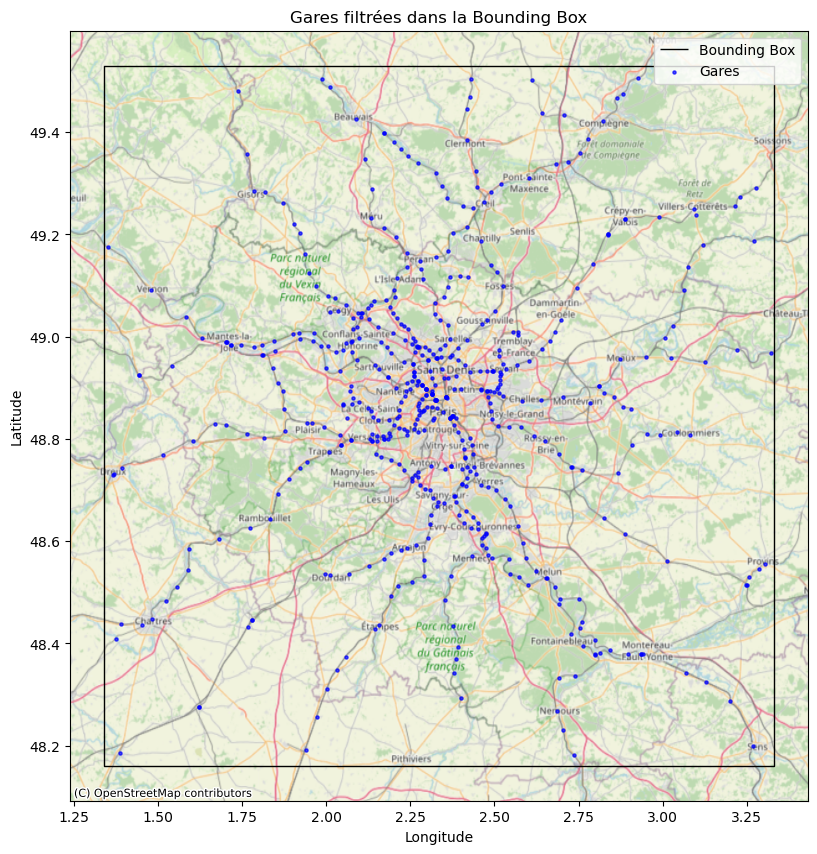

In [9]:
# Séparer la colonne "Geo Point" en latitude et longitude
gares_df[['latitude', 'longitude']] = gares_df['Geo Point'].str.split(',', expand=True).astype(float)

# Convertir en GeoDataFrame
gares_gdf = gpd.GeoDataFrame(gares_df, geometry=gpd.points_from_xy(gares_df.longitude, gares_df.latitude), crs="EPSG:4326")

#min_lat = 48.7
#max_lat = 49
#min_lon = 2.1
#max_lon = 2.6

# Create the bounding box
bbox = box(min_lon - 0.1, min_lat - 0.1, max_lon + 0.1, max_lat + 0.1)

# Garder uniquement les gares à l'intérieur de la bounding box
gares_gdf = gares_gdf[gares_gdf.geometry.within(bbox)]

# Garder uniquement les gares qui contiennent "VOYAGEURS Valle O" dans la colonne LIBELLE
gares_gdf = gares_gdf[gares_gdf['VOYAGEURS'].str.contains("O", case=False, na=False)]

# Créer la figure et les axes
fig, ax = plt.subplots(figsize=(10, 10))

# Tracer la bounding box
bbox_gdf = gpd.GeoDataFrame(geometry=[bbox], crs="EPSG:4326")
bbox_gdf.boundary.plot(ax=ax, color='black', linewidth=1, label='Bounding Box')

# Tracer les gares filtrées
gares_gdf.plot(ax=ax, color='blue', markersize=5, alpha=0.7, label='Gares')

# Ajouter les noms des gares
#for x, y, name in zip(gares_gdf.geometry.x, gares_gdf.geometry.y, gares_gdf['LIBELLE']):
  #  ax.text(x, y, name, fontsize=9, ha='right', color='black', bbox=dict(facecolor='white', alpha=0.05))

# Ajouter une carte OpenStreetMap en fond
ctx.add_basemap(ax, crs=gares_gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Finaliser le graphique
plt.legend()
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Gares filtrées dans la Bounding Box")
plt.show()

      latitude  longitude                       name
0    43.707654   7.281192     ACROPOLIS - JEAN BOUIN
1    46.153284  -1.140749                Jean Moulin
2    46.177584  -1.152233             Les Gonthières
3    44.823908  -0.530689            Arena - Metpark
4    44.842559  -0.647836  Merignac Centre - Metpark
..         ...        ...                        ...
207  48.820547   2.325849            PORTE D ORLEANS
208  48.873650   2.291993                       FOCH
209  48.838793   2.253734       PORTE DE SAINT CLOUD
210  48.886310   2.287848        PORTE DE CHAMPERRET
211  48.878739   2.282264              PORTE MAILLOT

[212 rows x 3 columns]
0


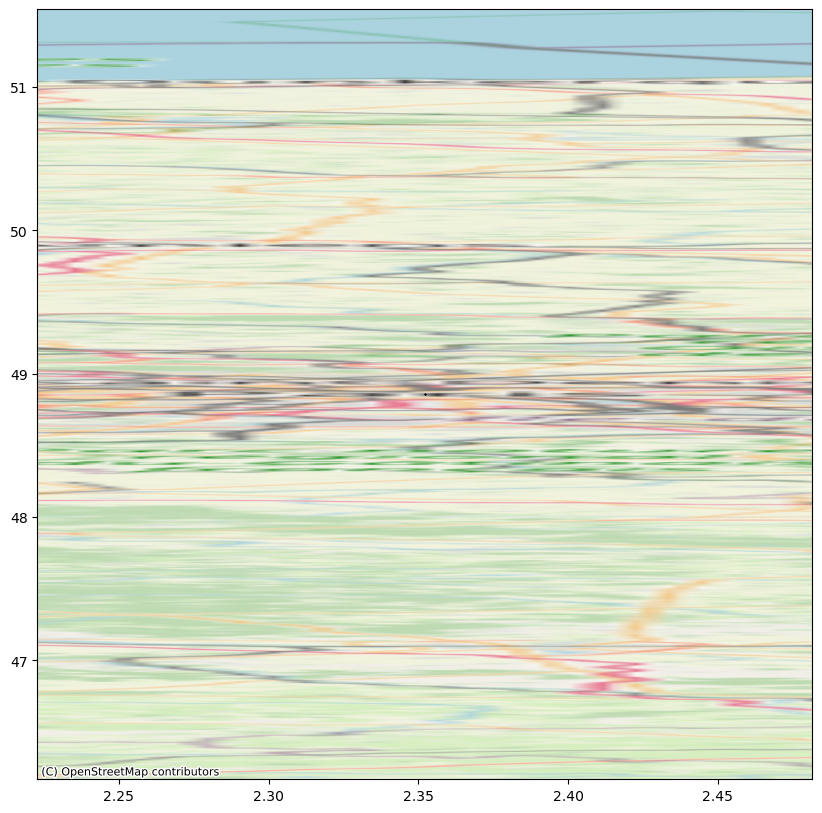

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/3193542020.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['parkRelais' + '_density'] = density
/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/3193542020.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['parkRelais' + '_distance'] = distances


       latitude  longitude                                         name
0     45.954232   5.342720           Arrêt covoit'ici Ambérieu en Bugey
1     45.956599   5.341196  Parking intermodal Gare d'Ambérieu en Bugey
2     46.259779   5.168004                                   Bourg-Nord
3     46.289572   5.158353                            Mairie d'Attignat
4     45.850757   5.100394                                        Balan
...         ...        ...                                          ...
8386  46.926000   3.275863                                        IMPHY
8387  47.973000   3.353326                                         BEON
8388  47.555000   4.446139                           VENAREY-LES-LAUMES
8389  47.724000   3.544736                                  GY-L'EVEQUE
8390  47.395000   5.455443                          ESSERTENNE-ET-CECEY

[8391 rows x 3 columns]
0


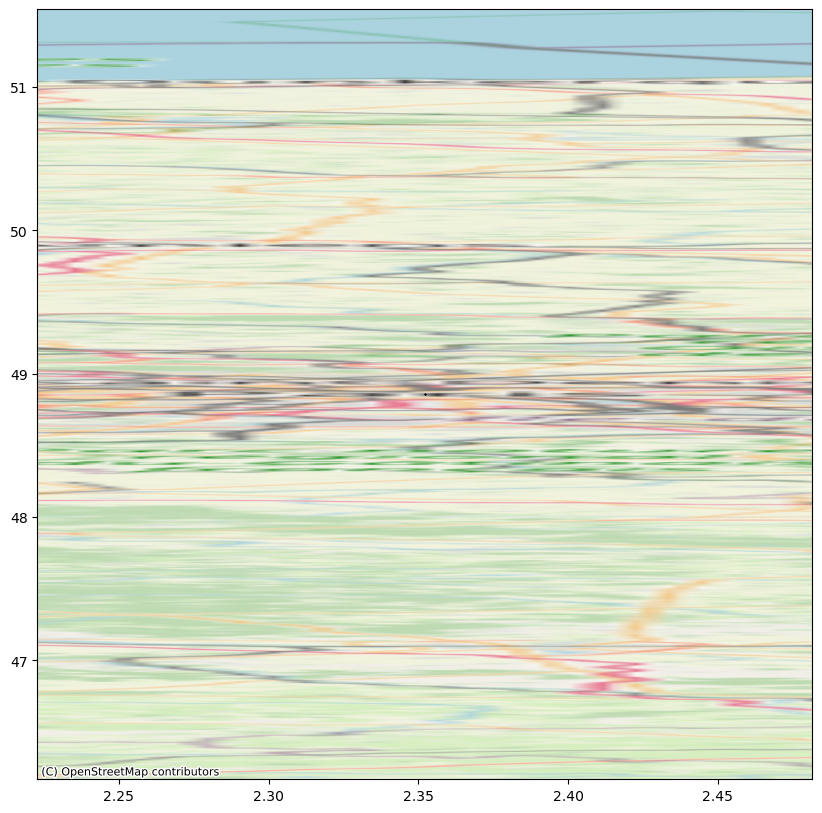

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/3193542020.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['parkCarpooling' + '_density'] = density
/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/3193542020.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['parkCarpooling' + '_distance'] = distances


      latitude  longitude                    name
0    48.893437   2.238472              La Défense
1    49.264337   2.469339                   Creil
2    48.652126   2.311349  Ste-Geneviève-des-Bois
3    48.829206   2.263062       Issy-Val-de-Seine
4    48.709291   2.279341                Champlan
..         ...        ...                     ...
542  48.887647   2.313387           Pont-Cardinet
543  48.717885   2.254850               Massy-TGV
544  49.386817   2.777318                    Jaux
545  49.091168   1.478464          Vernon-Giverny
546  48.533577   2.009826                 Dourdan

[547 rows x 3 columns]
1


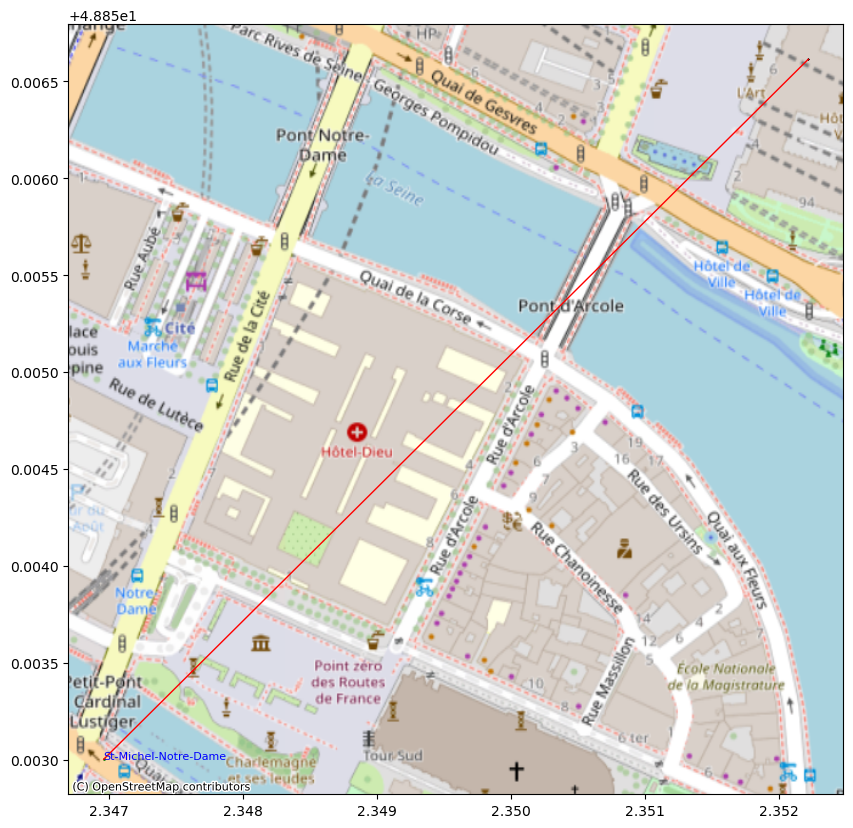

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/3193542020.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['trainstation_density'] = density
/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/3193542020.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['trainstation_distance'] = distances


In [10]:
#Extract land feature
import nbimporter 

# Now import the function from the Jupyter notebook
from min_distance import find_nearest_neighbors_osmnx,find_nearest_neighbors_scratch
from density import find_density_osmnx, find_density_scratch

bbox = box(min_lon-0.01, min_lat-0.01, max_lon+0.01, max_lat+0.01)

#file_path_1 = 'data_CSV/base-nationale-des-lieux-de-stationnement.csv'
file_path_2 = 'data_CSV/baseparkrelais.csv'
file_path_3 = 'data_CSV/bnlcovoiturage.csv'

#df_1 = pd.read_csv(file_path_1, sep=';')
df_2 = pd.read_csv(file_path_2, sep=';')
df_3 = pd.read_csv(file_path_3, sep=',')

#######density = find_density_scratch(paris_df, df_1['Ylat'],df_1['Xlong'],df_1['nom'])
#paris_df['parking' + '_density'] = density
#indices, id_points, distances, id_lat, id_lon = find_nearest_neighbors_scratch(paris_df, df_1['Ylat'],df_1['Xlong'],df_1['nom'])
#paris_df['parking' + '_distance'] = distances

density = find_density_scratch(paris_df, df_2['Ylat'],df_2['Xlong'],df_2['nom'])
paris_df['parkRelais' + '_density'] = density
indices, id_points, distances, id_lat, id_lon = find_nearest_neighbors_scratch(paris_df, df_2['Ylat'],df_2['Xlong'],df_2['nom'])
paris_df['parkRelais' + '_distance'] = distances

density = find_density_scratch(paris_df, df_3['Ylat'],df_3['Xlong'],df_3['nom_lieu'])
paris_df['parkCarpooling' + '_density'] = density
indices, id_points, distances, id_lat, id_lon = find_nearest_neighbors_scratch(paris_df, df_3['Ylat'],df_3['Xlong'],df_3['nom_lieu'])
paris_df['parkCarpooling' + '_distance'] = distances

list_trainstation_lat = gares_gdf.geometry.y.tolist()
list_trainstation_lon = gares_gdf.geometry.x.tolist()
list_trainstation_name = gares_gdf['LIBELLE'].tolist()

# Mettre à jour le calcul de densité et distance
density = find_density_scratch(paris_df, list_trainstation_lat, list_trainstation_lon, list_trainstation_name)
paris_df['trainstation_density'] = density
indices, id_points, distances, id_lat, id_lon = find_nearest_neighbors_scratch(paris_df, list_trainstation_lat, list_trainstation_lon, list_trainstation_name)
paris_df['trainstation_distance'] = distances

    latitude  longitude                                 name
0  49.009407   2.550579  Aéroport de Paris-Charles de Gaulle
1  48.730671   2.373217               Aéroport de Paris-Orly
0


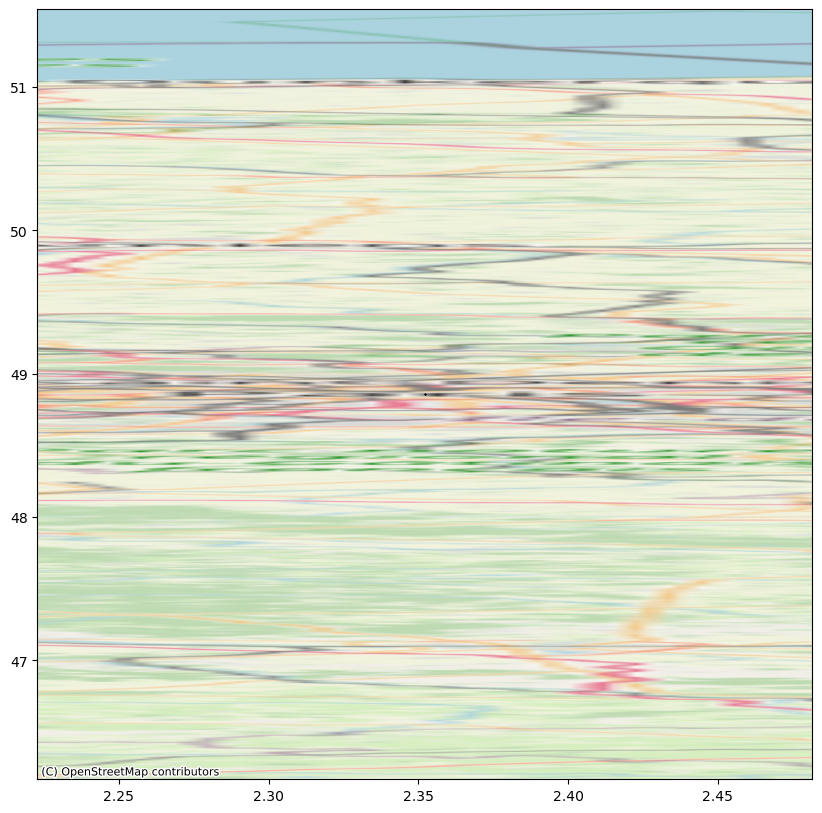

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/886084770.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['airport' + '_density'] = density
/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/886084770.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['airport' + '_distance'] = distances


       latitude  longitude                               name
0     48.870630   2.333210  Paris | Boulevard des Capucines 7
1     48.857124   2.327753              Paris | Rue du Bac 35
2     48.841206   2.374883             Paris | Rue Villiot 10
3     48.826504   2.343366         Paris | Rue de Tolbiac 234
4     48.843754   2.320272      Paris | Avenue du Maine 16/18
...         ...        ...                                ...
2174  49.103903   1.448950                                   
2175  49.091589   1.487645                                   
2176  49.074995   1.530236                                   
2177  49.074916   1.530208                                   
2178  49.095801   1.466163                                   

[2179 rows x 3 columns]
11


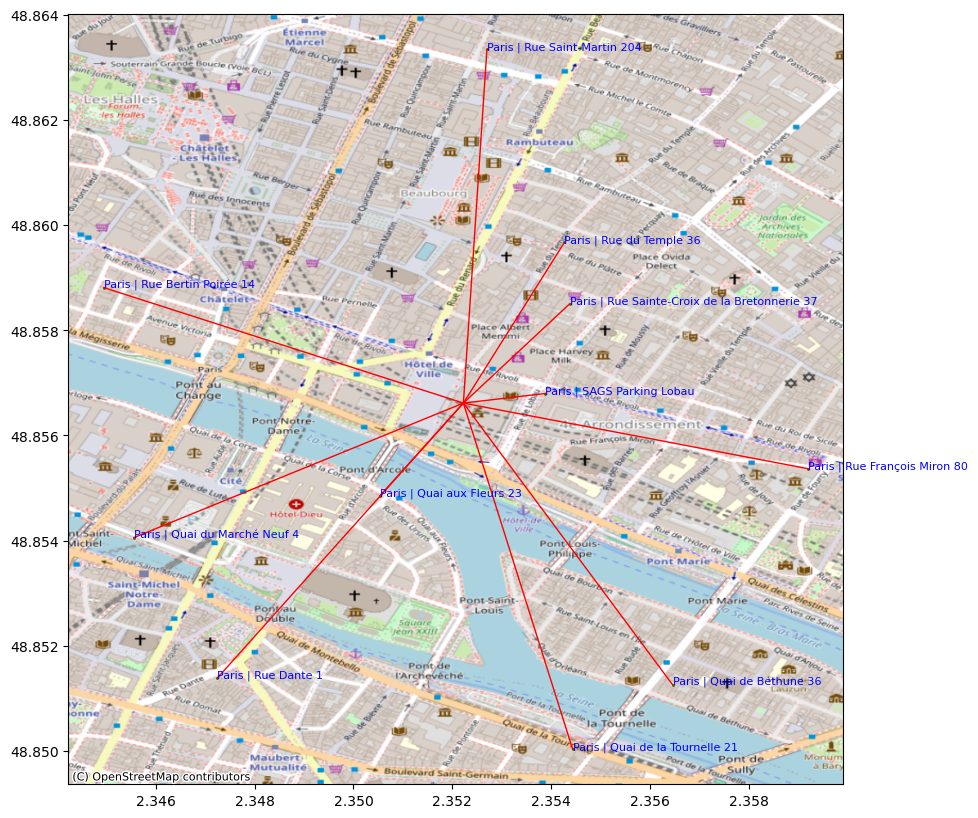

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/886084770.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['electric' + '_density'] = density
/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/886084770.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['electric' + '_distance'] = distances


amenity


density.ipynb:19: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ]
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  return features.features_from_bbox(north, south, east, west

437


density.ipynb:64: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  },


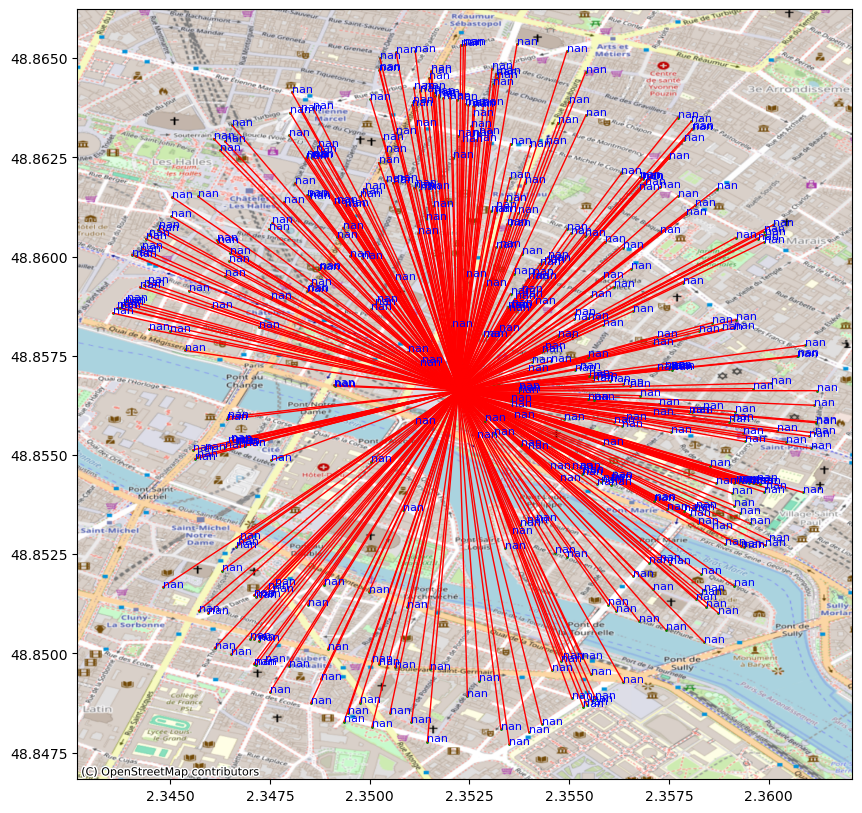

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/886084770.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df[name[1] + '_density'] = density
min_distance.ipynb:9: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  "name": "stderr",
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the 

density length: 169283
distances length: 169283
railway


density.ipynb:19: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ]
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  return features.features_from_bbox(north, south, east, west

0


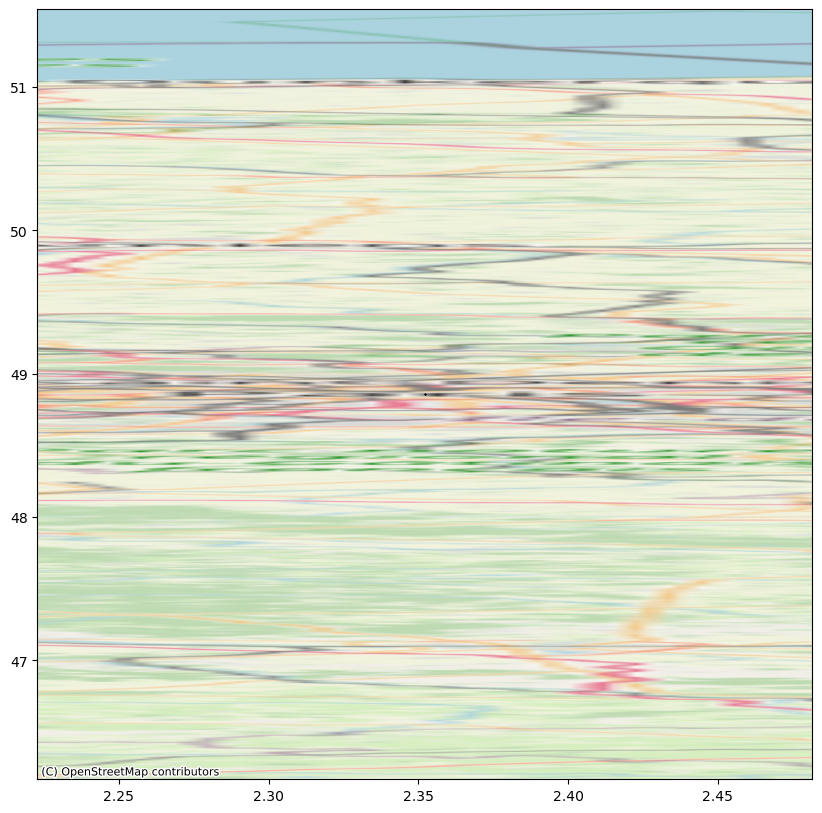

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/886084770.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df[name[1] + '_density'] = density
min_distance.ipynb:9: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  "name": "stderr",
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the 

density length: 169283
distances length: 169283
railway


density.ipynb:19: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ]
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  return features.features_from_bbox(north, south, east, west

54


density.ipynb:64: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  },


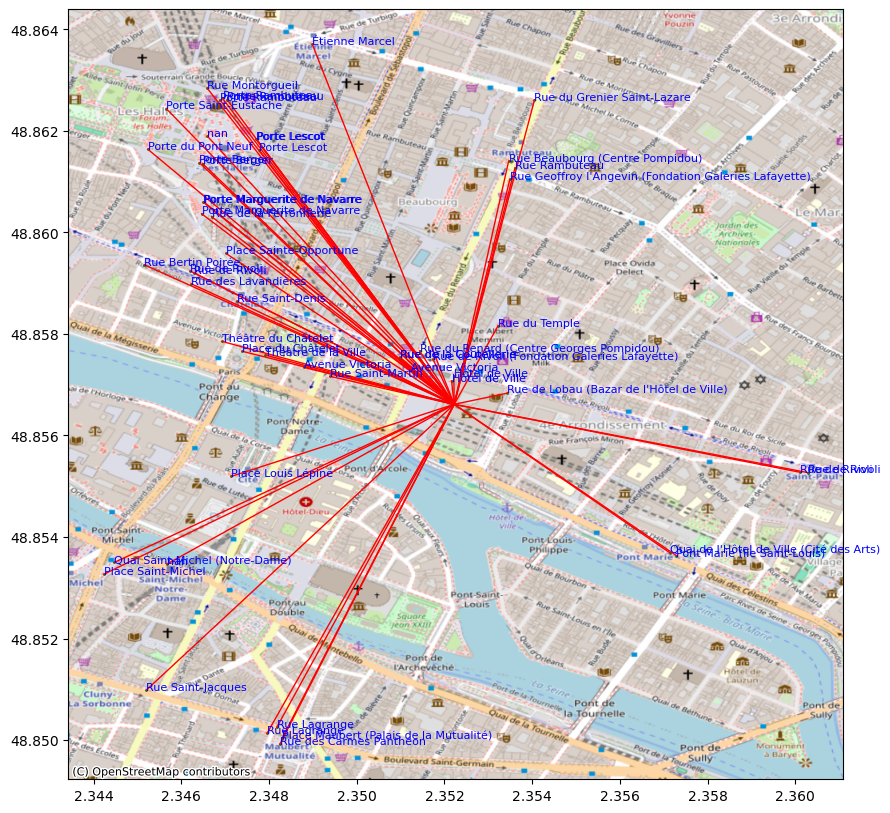

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/886084770.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df[name[1] + '_density'] = density
min_distance.ipynb:9: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  "name": "stderr",
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the 

density length: 169283
distances length: 169283
highway


density.ipynb:19: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ]
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  return features.features_from_bbox(north, south, east, west

82


density.ipynb:64: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  },


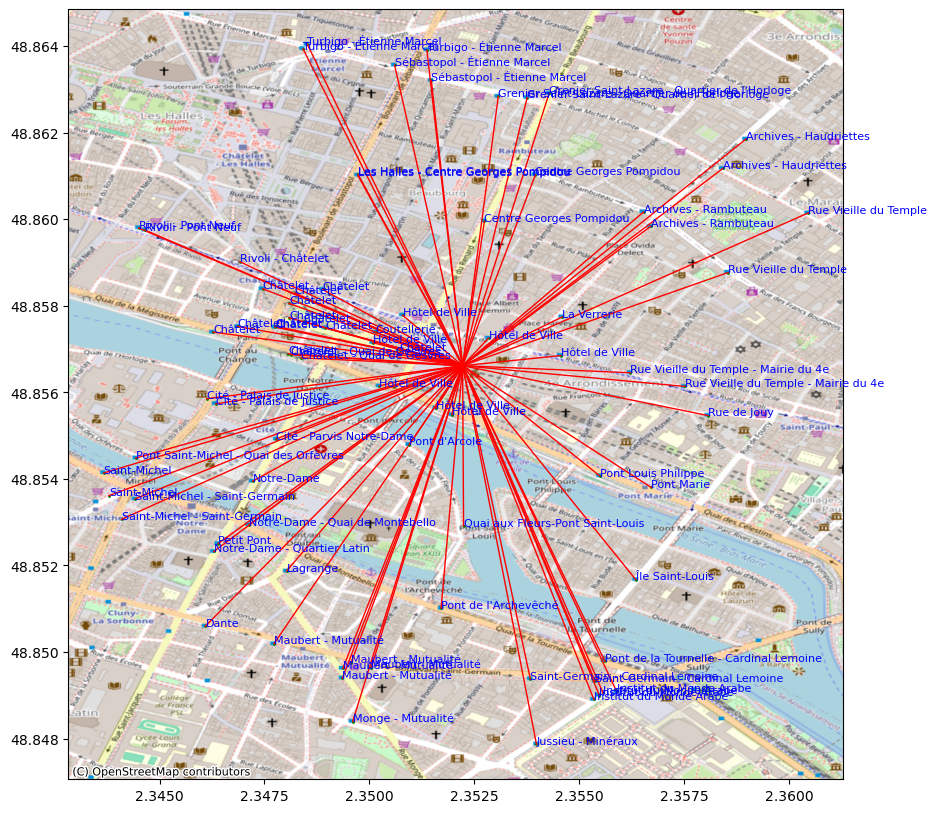

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/886084770.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df[name[1] + '_density'] = density
min_distance.ipynb:9: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  "name": "stderr",
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the 

density length: 169283
distances length: 169283
amenity


density.ipynb:19: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ]
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  return features.features_from_bbox(north, south, east, west

38


density.ipynb:64: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  },


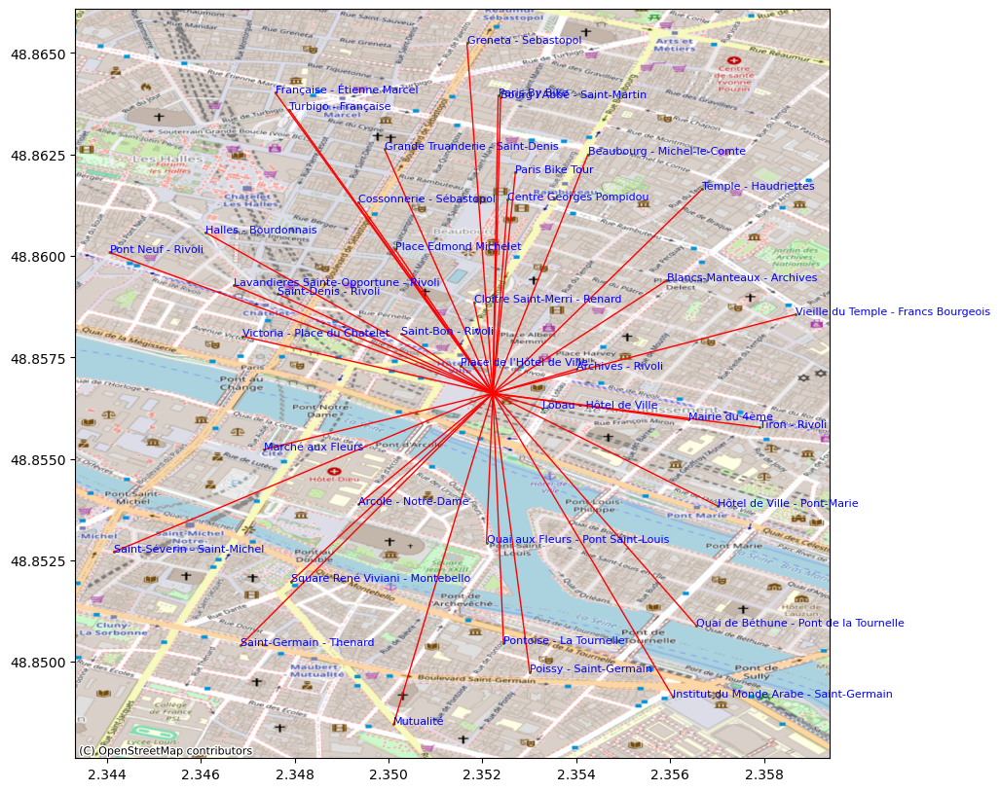

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/886084770.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df[name[1] + '_density'] = density
min_distance.ipynb:9: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  "name": "stderr",
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the 

density length: 169283
distances length: 169283
amenity


density.ipynb:19: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ]
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  return features.features_from_bbox(north, south, east, west

0


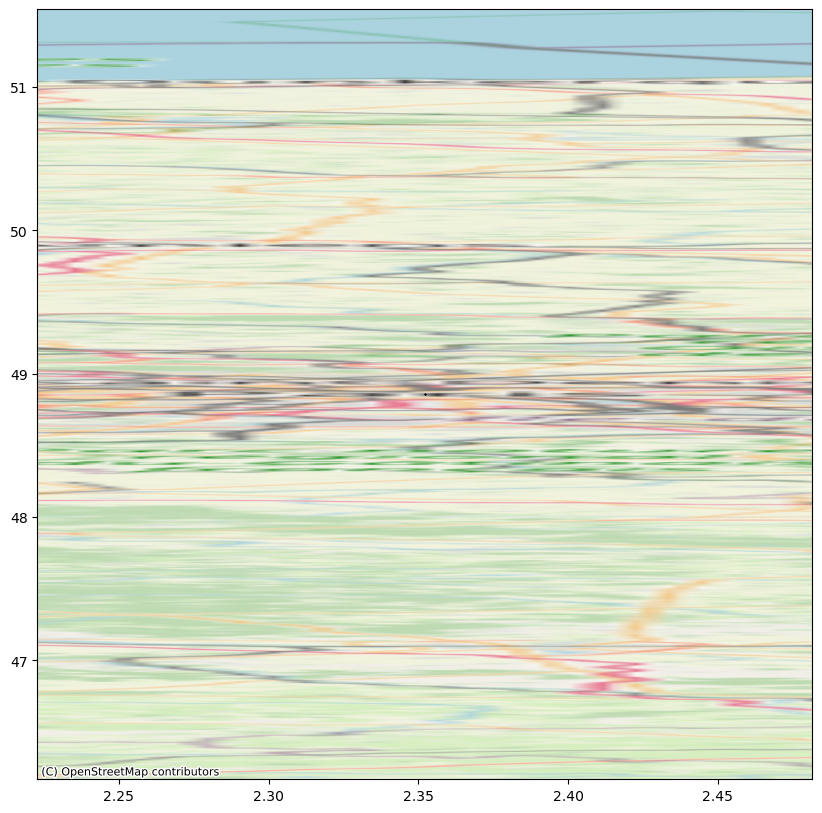

/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/886084770.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df[name[1] + '_density'] = density
min_distance.ipynb:9: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  "name": "stderr",
/opt/anaconda3/lib/python3.9/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the 

density length: 169283
distances length: 169283


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/886084770.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df[name[1] + '_distance'] = distances


In [11]:
list_airport_lat = [49.00940719825008,48.73067053559668]
list_airport_lon = [2.5505790855302326,2.3732165049156952]
list_airport_name = ['Aéroport de Paris-Charles de Gaulle','Aéroport de Paris-Orly']

density = find_density_scratch(paris_df, list_airport_lat,list_airport_lon,list_airport_name)
paris_df['airport' + '_density'] = density
indices, id_points, distances, id_lat, id_lon = find_nearest_neighbors_scratch(paris_df, list_airport_lat,list_airport_lon,list_airport_name)
paris_df['airport' + '_distance'] = distances

# https://medias.cdn.vsct.fr/faq/CARTE_RESEAU_Grande%20Vitesse_092021.pdf


#print('electric')
density = find_density_scratch(paris_df,combined_points['latitude'],combined_points['longitude'],combined_points['name'])
paris_df['electric' + '_density'] = density
indices, id_points, distances, id_lat, id_lon = find_nearest_neighbors_scratch(paris_df,combined_points['latitude'].tolist(),combined_points['longitude'].tolist(),combined_points['name'].tolist())
paris_df['electric' + '_distance'] = distances
#print('density length:',len(density))
#print('distances length:',len(distances))

all_values = [['amenity','bicycle_parking'],['railway','tram_stop'],['railway','subway_entrance'],['highway','bus_stop'],['amenity','bicycle_rental'],['amenity','fuel']]
              #,'bicycle_rental','car_sharing','charging_station','fuel','parking']

for name in all_values:
    print(name[0])
    density = find_density_osmnx(paris_df, name[0], name[1])
    paris_df[name[1] + '_density'] = density
    indices, id_points, distances, id_lat, id_lon = find_nearest_neighbors_osmnx(paris_df, name[0], name[1])
    paris_df[name[1] + '_distance'] = distances
    print('density length:',len(density))
    print('distances length:',len(distances))

#density = find_density_osmnx(paris_df, 'public_transport', 'stop_position')
#paris_df['stop_position_density'] = density

#indices, id_points, distances, id_lat, id_lon = find_nearest_neighbors_osmnx(paris_df, 'public_transport', 'stop_position')
#paris_df['stop_position_distance'] = distances


In [12]:
#file_path_1 = 'data_CSV/base-nationale-des-lieux-de-stationnement.csv'
file_path_6 = 'data_CSV/code_postal.csv'

#df_1 = pd.read_csv(file_path_1, sep=';')
df_6 = pd.read_csv(file_path_6, sep=',')

In [13]:
print(df_6[df_6['#Code_commune_INSEE'] == 78143]['polygon'].iloc[0])

MULTIPOLYGON (((2.1014817 48.756323, 2.1007248 48.7561176, 2.09903 48.7564197, 2.0977603 48.756447, 2.0947713 48.7556022, 2.0922343 48.7555245, 2.0918041 48.7542899, 2.0919493 48.7542343, 2.0915097 48.7536958, 2.0899427 48.7541606, 2.0884998 48.7525836, 2.0854972 48.7532334, 2.0784951 48.7539675, 2.0800514 48.7519558, 2.0809621 48.7511451, 2.0846882 48.7488675, 2.0863841 48.7475574, 2.0854912 48.7465108, 2.0879014 48.7454121, 2.0865759 48.7442138, 2.0871227 48.7440542, 2.0868206 48.7434412, 2.0866246 48.7424404, 2.0870035 48.7409924, 2.086569 48.7412661, 2.0856119 48.7412498, 2.0855868 48.7403492, 2.0837116 48.74011, 2.0835131 48.7396425, 2.0820401 48.7393434, 2.0817552 48.7391487, 2.0824416 48.7383957, 2.083759 48.7378698, 2.0841558 48.7373466, 2.0844791 48.7372079, 2.0842324 48.7365458, 2.0843751 48.736394, 2.0842022 48.7361741, 2.0842559 48.7359028, 2.0845809 48.7359044, 2.0845792 48.7357668, 2.0855744 48.7350027, 2.0865623 48.7344175, 2.0843722 48.733611, 2.0823566 48.7323965, 2.08

In [14]:
from shapely.geometry import Polygon

# Find the row index for #Code_commune_INSEE == 78143
row_index = df_6[df_6['#Code_commune_INSEE'] == 78143].index[0]

# Print the current 'polygon' value to check
print("Current Polygon:", df_6.loc[row_index, 'polygon'])

# Manually create a new Polygon (example: create a simple square polygon)
# This is just an example, you can create your own manually or use any valid Polygon object
new_polygon = "POLYGON ((2.1014817 48.756323, 2.1007248 48.7561176, 2.09903 48.7564197, 2.0977603 48.756447, 2.0947713 48.7556022, 2.0922343 48.7555245, 2.0918041 48.7542899, 2.0919493 48.7542343, 2.0915097 48.7536958, 2.0899427 48.7541606, 2.0884998 48.7525836, 2.0854972 48.7532334, 2.0784951 48.7539675, 2.0800514 48.7519558, 2.0809621 48.7511451, 2.0846882 48.7488675, 2.0863841 48.7475574, 2.0854912 48.7465108, 2.0879014 48.7454121, 2.0865759 48.7442138, 2.0871227 48.7440542, 2.0868206 48.7434412, 2.0866246 48.7424404, 2.0870035 48.7409924, 2.086569 48.7412661, 2.0856119 48.7412498, 2.0855868 48.7403492, 2.0837116 48.74011, 2.0835131 48.7396425, 2.0820401 48.7393434, 2.0817552 48.7391487, 2.0824416 48.7383957, 2.083759 48.7378698, 2.0841558 48.7373466, 2.0844791 48.7372079, 2.0842324 48.7365458, 2.0843751 48.736394, 2.0842022 48.7361741, 2.0842559 48.7359028, 2.0845809 48.7359044, 2.0845792 48.7357668, 2.0855744 48.7350027, 2.0865623 48.7344175, 2.0843722 48.733611, 2.0823566 48.7323965, 2.0815515 48.7314755, 2.0819885 48.7310597, 2.0811989 48.7301865, 2.0843849 48.7282358, 2.0856863 48.7280622, 2.0876065 48.7283522, 2.0900558 48.7276171, 2.093105 48.7272481, 2.0934242 48.726951, 2.0939885 48.7269454, 2.0942646 48.7267083, 2.0931536 48.7260153, 2.0936703 48.7253024, 2.0947727 48.7246091, 2.0961462 48.7242723, 2.0982523 48.7244969, 2.1037556 48.7229193, 2.1043642 48.7224661, 2.1045112 48.7221416, 2.1043769 48.7218833, 2.1051722 48.7209295, 2.1051063 48.7201761, 2.1060872 48.7194171, 2.1071216 48.7201409, 2.1083861 48.7205227, 2.1099505 48.7213403, 2.1117602 48.7225204, 2.1119927 48.7228397, 2.1126195 48.7229145, 2.1121543 48.7230882, 2.1115261 48.7242934, 2.1097107 48.7256794, 2.1085562 48.7276803, 2.1067926 48.7288085, 2.1030328 48.7302555, 2.102271 48.7307544, 2.1021704 48.730911, 2.1022769 48.731438, 2.1036711 48.7329128, 2.1020317 48.7329635, 2.0987453 48.7339839, 2.0980002 48.7343758, 2.0980315 48.73469, 2.0989539 48.7353689, 2.1026919 48.7377527, 2.1029643 48.7376469, 2.1046435 48.738138, 2.1057019 48.7416907, 2.105484 48.7417071, 2.1058505 48.7425382, 2.1034969 48.7429065, 2.1018719 48.7417051, 2.1009931 48.7427509, 2.1012496 48.7438052, 2.1022879 48.7442457, 2.1016528 48.7448795, 2.1026383 48.7453834, 2.0999722 48.7453256, 2.0983215 48.7455371, 2.098858 48.7462886, 2.1016558 48.748973, 2.1034791 48.7513901, 2.1040374 48.7522227, 2.1047172 48.7547832, 2.1058806 48.7559531, 2.106463 48.7576133, 2.1014817 48.756323))"

# Update the 'polygon' column with the new manually created Polygon
df_6.loc[row_index, 'polygon'] = new_polygon

# Print the updated row to confirm
print("Updated Row:", df_6.loc[row_index])


Current Polygon: MULTIPOLYGON (((2.1014817 48.756323, 2.1007248 48.7561176, 2.09903 48.7564197, 2.0977603 48.756447, 2.0947713 48.7556022, 2.0922343 48.7555245, 2.0918041 48.7542899, 2.0919493 48.7542343, 2.0915097 48.7536958, 2.0899427 48.7541606, 2.0884998 48.7525836, 2.0854972 48.7532334, 2.0784951 48.7539675, 2.0800514 48.7519558, 2.0809621 48.7511451, 2.0846882 48.7488675, 2.0863841 48.7475574, 2.0854912 48.7465108, 2.0879014 48.7454121, 2.0865759 48.7442138, 2.0871227 48.7440542, 2.0868206 48.7434412, 2.0866246 48.7424404, 2.0870035 48.7409924, 2.086569 48.7412661, 2.0856119 48.7412498, 2.0855868 48.7403492, 2.0837116 48.74011, 2.0835131 48.7396425, 2.0820401 48.7393434, 2.0817552 48.7391487, 2.0824416 48.7383957, 2.083759 48.7378698, 2.0841558 48.7373466, 2.0844791 48.7372079, 2.0842324 48.7365458, 2.0843751 48.736394, 2.0842022 48.7361741, 2.0842559 48.7359028, 2.0845809 48.7359044, 2.0845792 48.7357668, 2.0855744 48.7350027, 2.0865623 48.7344175, 2.0843722 48.733611, 2.0823566

In [15]:
import pandas as pd
import geopandas as gpd
from shapely import wkt
from shapely.geometry import shape
from shapely.validation import make_valid

def parse_polygon(geom):
    try:
        # Check if geometry is in WKT format
        if geom.startswith("POLYGON"):
            return wkt.loads(geom)
        
        # Check if geometry is in GeoJSON format
        elif geom.startswith("{") and "type" in geom and "coordinates" in geom:
            return shape(eval(geom))  # Use `shape` for GeoJSON
        
        else:
            # If not recognizable, return None
            return None
    except Exception as e:
        print(f"Error parsing geometry: {e}")
        return None

# Step 1: Parse geometries in df_6
df_6['polygon'] = df_6['polygon'].apply(parse_polygon)


####
# Step 2: Validate and fix invalid geometries
df_6['polygon'] = df_6['polygon'].apply(lambda geom: make_valid(geom) if geom and not geom.is_valid else geom)

# Step 3: Drop rows with unparseable geometries
df_6 = df_6[df_6['polygon'].notnull()]

# Step 4: Convert to GeoDataFrame for spatial operations
df_6 = gpd.GeoDataFrame(df_6, geometry='polygon')

# Ensure valid CRS
df_6.set_crs("EPSG:4326", inplace=True)

Error parsing geometry: 'float' object has no attribute 'startswith'
Error parsing geometry: 'float' object has no attribute 'startswith'
Error parsing geometry: 'float' object has no attribute 'startswith'
Error parsing geometry: 'float' object has no attribute 'startswith'
Error parsing geometry: 'float' object has no attribute 'startswith'
Error parsing geometry: 'float' object has no attribute 'startswith'
Error parsing geometry: 'float' object has no attribute 'startswith'
Error parsing geometry: 'float' object has no attribute 'startswith'
Error parsing geometry: 'float' object has no attribute 'startswith'
Error parsing geometry: 'float' object has no attribute 'startswith'
Error parsing geometry: 'float' object has no attribute 'startswith'
Error parsing geometry: 'float' object has no attribute 'startswith'


,#Code_commune_INSEE,Nom_de_la_commune,Code_postal,Libellé_d_acheminement,Ligne_5,_contours_commune.geometry,polygon,codgeo,dens_pop,CODGEO_2024_x,...,Rural à habitat dispersé,Rural à habitat très dispersé,Hors unité urbaine,Banlieue,Centre,Isolées,population,area,safety,safety1
0,1001,L ABERGEMENT CLEMENCIAT,1400,L ABERGEMENT CLEMENCIAT,NaN,"{""type"":""Polygon"",""coordinates"":[[[4.9584116,4...","POLYGON ((4.95841 46.15327, 4.95559 46.15397, ...",1001.0,52.33,1001.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.095382,0.001823,0.000000,0.000000
1,1002,L ABERGEMENT DE VAREY,1640,L ABERGEMENT DE VAREY,NaN,"{""type"":""Polygon"",""coordinates"":[[[5.4302024,4...","POLYGON ((5.43020 45.98277, 5.43441 45.98428, ...",1002.0,29.02,1002.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.030975,0.001067,0.000000,0.000000
2,1004,AMBERIEU EN BUGEY,1500,AMBERIEU EN BUGEY,NaN,"{""type"":""Polygon"",""coordinates"":[[[5.4088198,4...","POLYGON ((5.40882 45.94206, 5.40942 45.94592, ...",1004.0,603.82,1004.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.720902,0.002850,27.840056,0.079345
3,1005,AMBERIEUX EN DOMBES,1330,AMBERIEUX EN DOMBES,NaN,"{""type"":""Polygon"",""coordinates"":[[[4.9429765,4...","POLYGON ((4.94298 45.97962, 4.94260 45.98047, ...",1005.0,119.31,1005.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.222354,0.001864,4.407387,0.008214
4,1006,AMBLEON,1300,AMBLEON,NaN,"{""type"":""Polygon"",""coordinates"":[[[5.5708254,4...","POLYGON ((5.57083 45.75338, 5.57088 45.75316, ...",1006.0,19.15,1006.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.013383,0.000699,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34649,98736,PIRAE,98716,PIRAE,NaN,"{""coordinates"":[[[-149.5426606,-17.5210904],[-...","POLYGON ((-149.54266 -17.52109, -149.54287 -17...",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.002859,0.000000,NaN
34663,98750,TAPUTAPUATEA,98735,TAPUTAPUATEA,NaN,"{""coordinates"":[[[-151.3818622,-16.8836169],[-...","POLYGON ((-151.38186 -16.88362, -151.38199 -16...",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000602,0.000000,NaN
34665,98752,TEVA I UTA,98726,MATAIEA,TEVA I UTA,"{""coordinates"":[[[-149.391647,-17.6694872],[-1...","POLYGON ((-149.39165 -17.66949, -149.39190 -17...",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.004231,0.000000,NaN
34677,98806,FARINO,98881,FARINO,NaN,"{""coordinates"":[[[165.72081381903288,-21.67916...","POLYGON ((165.72081 -21.67917, 165.72046 -21.6...",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.004190,0.000000,NaN


In [16]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Liste des catégories de densité
categories_densite = [
    "Grands centres urbains",
    "Centres urbains intermédiaires",
    "Petites villes",
    "Ceintures urbaines",
    "Bourgs ruraux",
    "Rural à habitat dispersé",
    "Rural à habitat très dispersé"
]

# Liste des catégories de densité
categories_statut_comm = [
    "Hors unité urbaine",
    "Banlieue",
    "Centre",
    "Isolées"
]

# Step 1: Filter df_6 to keep only relevant #Code_commune_INSEE
valid_prefixes = ('27', '28', '45', '60', '75', '77', '78', '89', '91', '92', '93', '94', '95')
df_6 = df_6[df_6['#Code_commune_INSEE'].astype(str).str.startswith(valid_prefixes)]

# Step 2: Create GeoDataFrame for paris_df
paris_df['geometry'] = paris_df.apply(
    lambda row: Point(row['departure_longitude'], row['departure_latitude']), axis=1
)
paris_gdf = gpd.GeoDataFrame(paris_df, geometry='geometry', crs='EPSG:4326')
target_crs = "EPSG:4326"  # or a local CRS for Paris, e.g., "EPSG:2154"

# Convert df_6 to GeoDataFrame if not already
if not isinstance(df_6, gpd.GeoDataFrame):
    df_6 = gpd.GeoDataFrame(df_6, geometry='polygon', crs='EPSG:4326')

# Ensure both GeoDataFrames use the same CRS
if paris_gdf.crs != df_6.crs:
    paris_gdf = paris_gdf.set_crs(df_6.crs)

# Step 3: Directly filter points within each polygon
# Create an empty column to store matched codes
paris_df['#Code_commune_INSEE'] = None

# Buffer distance (in CRS units, typically degrees for EPSG:4326)
buffer_distance = 0.00003  # Adjust this value as needed (e.g., 0.00004 ~ 4.45 meters)

for _, polygon_row in df_6.iterrows():
    polygon_geom = polygon_row['polygon'].buffer(buffer_distance)  # Extend the polygon slightly
    code_commune = polygon_row['#Code_commune_INSEE']

    # Find points within the buffered polygon
    points_inside = paris_gdf[paris_gdf['geometry'].within(polygon_geom)]

    # Assign the code to matching points
    paris_df.loc[points_inside.index, '#Code_commune_INSEE'] = code_commune

# First, create a mapping of #Code_commune_INSEE to norm_weighted_sum
code_to_norm_weighted_sum = df_6.set_index('#Code_commune_INSEE')['safety']

# Map the `norm_weighted_sum` to paris_df using the #Code_commune_INSEE column
paris_df['safety'] = paris_df['#Code_commune_INSEE'].map(code_to_norm_weighted_sum)

# First, create a mapping of #Code_commune_INSEE to norm_weighted_sum
code_to_dens_pop = df_6.set_index('#Code_commune_INSEE')['dens_pop']

# Map the `norm_weighted_sum` to paris_df using the #Code_commune_INSEE column
paris_df['dens_pop'] = paris_df['#Code_commune_INSEE'].map(code_to_dens_pop)

code_mappings_densite = {f'code_{i}': df_6.set_index('#Code_commune_INSEE')[f'{i}'] for i in categories_densite}
code_mappings_statut_comm = {f'code_{j}': df_6.set_index('#Code_commune_INSEE')[f'{j}'] for j in categories_statut_comm}
for i in categories_densite:
    paris_df[f'{i}'] = paris_df['#Code_commune_INSEE'].map(code_mappings_densite[f'code_{i}'])

for j in categories_statut_comm:
    paris_df[f'{j}'] = paris_df['#Code_commune_INSEE'].map(code_mappings_statut_comm[f'code_{j}'])

# Step 4: Print points not inside any polygon
unmatched_points = paris_df[paris_df['#Code_commune_INSEE'].isnull()]
if not unmatched_points.empty:
    print("Points not inside any polygon:")
    print(unmatched_points[['departure_latitude', 'departure_longitude']])

print(paris_df)


/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/1082471898.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['geometry'] = paris_df.apply(
/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/1082471898.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  paris_df['#Code_commune_INSEE'] = None
/var/folders/ym/s4xnst_s0y769j7rl84pgpww0000gn/T/ipykernel_20272/1082471898.py:64: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
T

       departure   arrival           route departure_date_num  \
7          Paris    Amiens    Paris-Amiens          09apr2018   
8          Paris  Bordeaux  Paris-Bordeaux          05apr2018   
9          Paris   Le Mans   Paris-Le Mans          12jul2018   
10         Paris     Lille     Paris-Lille          07apr2018   
11         Paris      Lyon      Paris-Lyon          28apr2018   
...          ...       ...             ...                ...   
278125     Paris  Toulouse  Paris-Toulouse          03jun2018   
278126     Paris  Toulouse  Paris-Toulouse          26jul2018   
278127     Paris  Toulouse  Paris-Toulouse          08may2018   
278128     Paris  Toulouse  Paris-Toulouse          21may2018   
278129     Paris  Toulouse  Paris-Toulouse          07apr2018   

            departure_time  seats_total  seats_booked  distance_BBC  \
7      2025-03-12 22:00:00          3.0           2.0         131.0   
8      2025-03-12 16:00:48          3.0           1.0         620.0   
9     

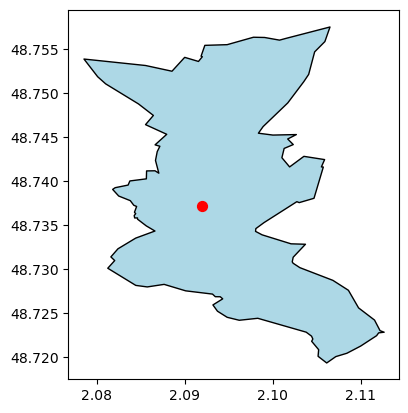

In [17]:
import matplotlib.pyplot as plt
from shapely.wkt import loads
from shapely.geometry import Point
import geopandas as gpd

# Define the WKT string for the polygon
wkt_polygon = "POLYGON ((2.1014817 48.756323, 2.1007248 48.7561176, 2.09903 48.7564197, 2.0977603 48.756447, 2.0947713 48.7556022, 2.0922343 48.7555245, 2.0918041 48.7542899, 2.0919493 48.7542343, 2.0915097 48.7536958, 2.0899427 48.7541606, 2.0884998 48.7525836, 2.0854972 48.7532334, 2.0784951 48.7539675, 2.0800514 48.7519558, 2.0809621 48.7511451, 2.0846882 48.7488675, 2.0863841 48.7475574, 2.0854912 48.7465108, 2.0879014 48.7454121, 2.0865759 48.7442138, 2.0871227 48.7440542, 2.0868206 48.7434412, 2.0866246 48.7424404, 2.0870035 48.7409924, 2.086569 48.7412661, 2.0856119 48.7412498, 2.0855868 48.7403492, 2.0837116 48.74011, 2.0835131 48.7396425, 2.0820401 48.7393434, 2.0817552 48.7391487, 2.0824416 48.7383957, 2.083759 48.7378698, 2.0841558 48.7373466, 2.0844791 48.7372079, 2.0842324 48.7365458, 2.0843751 48.736394, 2.0842022 48.7361741, 2.0842559 48.7359028, 2.0845809 48.7359044, 2.0845792 48.7357668, 2.0855744 48.7350027, 2.0865623 48.7344175, 2.0843722 48.733611, 2.0823566 48.7323965, 2.0815515 48.7314755, 2.0819885 48.7310597, 2.0811989 48.7301865, 2.0843849 48.7282358, 2.0856863 48.7280622, 2.0876065 48.7283522, 2.0900558 48.7276171, 2.093105 48.7272481, 2.0934242 48.726951, 2.0939885 48.7269454, 2.0942646 48.7267083, 2.0931536 48.7260153, 2.0936703 48.7253024, 2.0947727 48.7246091, 2.0961462 48.7242723, 2.0982523 48.7244969, 2.1037556 48.7229193, 2.1043642 48.7224661, 2.1045112 48.7221416, 2.1043769 48.7218833, 2.1051722 48.7209295, 2.1051063 48.7201761, 2.1060872 48.7194171, 2.1071216 48.7201409, 2.1083861 48.7205227, 2.1099505 48.7213403, 2.1117602 48.7225204, 2.1119927 48.7228397, 2.1126195 48.7229145, 2.1121543 48.7230882, 2.1115261 48.7242934, 2.1097107 48.7256794, 2.1085562 48.7276803, 2.1067926 48.7288085, 2.1030328 48.7302555, 2.102271 48.7307544, 2.1021704 48.730911, 2.1022769 48.731438, 2.1036711 48.7329128, 2.1020317 48.7329635, 2.0987453 48.7339839, 2.0980002 48.7343758, 2.0980315 48.73469, 2.0989539 48.7353689, 2.1026919 48.7377527, 2.1029643 48.7376469, 2.1046435 48.738138, 2.1057019 48.7416907, 2.105484 48.7417071, 2.1058505 48.7425382, 2.1034969 48.7429065, 2.1018719 48.7417051, 2.1009931 48.7427509, 2.1012496 48.7438052, 2.1022879 48.7442457, 2.1016528 48.7448795, 2.1026383 48.7453834, 2.0999722 48.7453256, 2.0983215 48.7455371, 2.098858 48.7462886, 2.1016558 48.748973, 2.1034791 48.7513901, 2.1040374 48.7522227, 2.1047172 48.7547832, 2.1058806 48.7559531, 2.106463 48.7576133, 2.1014817 48.756323))"

# Step 1: Convert the WKT string to a shapely Polygon object
polygon = loads(wkt_polygon)

# Step 2: Define a point (for example, at some latitude/longitude)
point = Point(2.091980,48.737179)  # Example point (longitude, latitude)

# Step 3: Create GeoDataFrames for both the polygon and the point
gdf_polygon = gpd.GeoDataFrame(geometry=[polygon])
gdf_point = gpd.GeoDataFrame(geometry=[point])

# Step 4: Plot the polygon and the point
fig, ax = plt.subplots()

# Plot the polygon
gdf_polygon.plot(ax=ax, color='lightblue', edgecolor='black')

# Plot the point
gdf_point.plot(ax=ax, color='red', marker='o', markersize=50)

# Show the plot
plt.show()


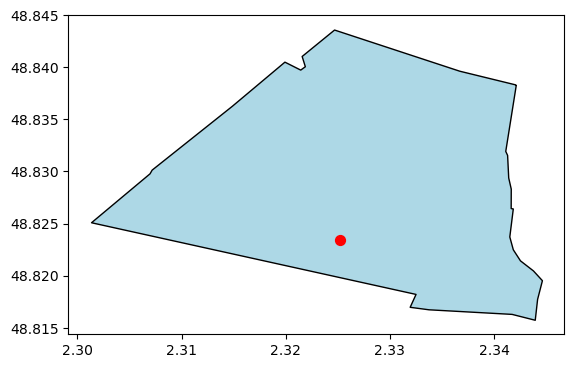

In [18]:
import matplotlib.pyplot as plt
from shapely.wkt import loads
from shapely.geometry import Point
import geopandas as gpd

# Define the WKT string for the polygon
wkt_polygon = "POLYGON ((2.3420856 48.838343, 2.336657 48.8396711, 2.3246418 48.8436213, 2.3215313 48.8410837, 2.3218371 48.8400988, 2.3213943 48.8397771, 2.3198775 48.8405392, 2.3148305 48.8363032, 2.3071353 48.8301782, 2.3069316 48.8298226, 2.3013154 48.8251258, 2.332461 48.8182471, 2.3318981 48.8170109, 2.3337111 48.816771, 2.3416837 48.8163304, 2.3439025 48.815767, 2.3441292 48.8177721, 2.3445915 48.8195644, 2.3437299 48.8205031, 2.3424851 48.8214694, 2.3417975 48.8225305, 2.3414605 48.8237608, 2.3417957 48.8264482, 2.3415922 48.8264902, 2.3416 48.8283529, 2.3413563 48.8294245, 2.3412499 48.8315887, 2.3410721 48.8319717, 2.3420856 48.838343))"

# Step 1: Convert the WKT string to a shapely Polygon object
polygon = loads(wkt_polygon)

# Step 2: Define a point (for example, at some latitude/longitude)
point = Point(2.325233,48.823410)  # Example point (longitude, latitude)

# Step 3: Create GeoDataFrames for both the polygon and the point
gdf_polygon = gpd.GeoDataFrame(geometry=[polygon])
gdf_point = gpd.GeoDataFrame(geometry=[point])

# Step 4: Plot the polygon and the point
fig, ax = plt.subplots()

# Plot the polygon
gdf_polygon.plot(ax=ax, color='lightblue', edgecolor='black')

# Plot the point
gdf_point.plot(ax=ax, color='red', marker='o', markersize=50)

# Show the plot
plt.show()


In [19]:
import requests
import zipfile
import os

file_path = 'data_CSV/final_array.csv'

paris_df.to_csv(file_path, index=False)
